In [466]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import fibsem
from fibsem.imaging import masks
from fibsem.imaging import utils   
from autoscript_sdb_microscope_client.structures import AdornedImage
from PIL import Image
import logging
import matplotlib.pyplot as plt
from scipy import ndimage as ndi
from skimage.segmentation import watershed
from skimage.feature import peak_local_max
from skimage import data
from skimage import filters
from skimage.color import rgb2gray
import imageio
import cv2
import glob
import itertools
import pandas as pd
from pprint import pprint
import plotly.express as px
import statsmodels
import ipywidgets
from dataclasses import dataclass
from skimage.feature import match_template
import skimage

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [467]:
# Create dictionary for IB images, sort by grid position, field with (img stack), and corresponding name/img position
dict1 = {}
dict2 = {}
dict3 = {}
grid_poses = ["000.000", "000.001", "000.002", "001.000", "001.001", "001.002", "002.000", "002.001", "002.002"]
hfws = ["8", "15", "20", "30", "50"]
names = ["base", "diag_down", "diag_up", "start"]

for grid_pos in grid_poses:
    dict1[grid_pos] = {}
    dict2[grid_pos] = {}
    for hfw in hfws:
        dict1[grid_pos][hfw] = {}
        dict2[grid_pos][hfw] = {}
        for name in names:
            fname1 = glob.glob(f"../../mapping_2022-09-27.01-18-18PM/{grid_pos}/{name}*{hfw}*.tif")[0]
            fname2 = glob.glob(f"../../mapping_2022-09-27.02-59-50PM/{grid_pos}/{name}*{hfw}*.tif")[0]
    
            img1 = mpimg.imread(fname1)
            img2 = mpimg.imread(fname2)
            dict1[grid_pos][hfw][name] = img1
            dict2[grid_pos][hfw][name] = img2

for grid_pos in ["000.000", "000.001", "001.000", "001.001"]:
    dict3[grid_pos] = {}
    for hfw in hfws:
        dict3[grid_pos][hfw] = {}
        for name in names:
            fname3 = glob.glob(f"../../mapping_2022-09-27.04-26-12PM/{grid_pos}/{name}*{hfw}*.tif")[0]
            img3 = mpimg.imread(fname3)
            dict3[grid_pos][hfw][name] = img3

# Create dictionary for Fluorescence images, sort by grid position (tile) and exposure times
# Additionally, transpose and crop the image array to the right IB image size.
fluor1 = {}
fluor2 = {}
fluor3 = {}
tiles = ["0.0", "0.1", "0.2", "1.0", "1.1", "1.2", "2.0", "2.1", "2.2"]
exposures = ["350", "500"]
for tile in tiles:
    fluor1[tile] = {}
    fluor2[tile] = {}
    for exposure in exposures:
        file1 = glob.glob(f"../../mapping_2022-09-27.01-18-18PM/fluro/{tile}*{exposure}*.tiff")[0]
        file2 = glob.glob(f"../../mapping_2022-09-27.02-59-50PM/fluro/{tile}*{exposure}*.tiff")[0]
        img1 = mpimg.imread(file1)
        img2 = mpimg.imread(file2)
        
        temp1 = np.flip(img1[512:1536, 256:1792], axis=0)
        temp2 = np.flip(img2[512:1536, 256:1792], axis=0)
        temp1_fft = np.fft.fftshift(np.fft.fft2(temp1))
        temp2_fft = np.fft.fftshift(np.fft.fft2(temp2))
        mat1 = np.ndarray((972, 1458), dtype=np.complex128)
        mat2 = np.ndarray((972, 1458), dtype=np.complex128)
        mat1[:,:] = temp1_fft[26:26+972, 39:39+1458]
        mat2[:,:] = temp2_fft[26:26+972, 39:39+1458]
        fluor1[tile][exposure] =  np.abs(np.fft.ifft2(np.fft.ifftshift(mat1)))
        fluor2[tile][exposure] =  np.abs(np.fft.ifft2(np.fft.ifftshift(mat2)))


for tile in ["0.0", "0.1", "1.0", "1.1"]:
    fluor3[tile] = {}
    for exposure in exposures:
        file3 = glob.glob(f"../../mapping_2022-09-27.04-26-12PM/fluro/{tile}*{exposure}*.tiff")[0]
        img3 = mpimg.imread(file3)

        temp3 = np.flip(img3[512:1536, 256:1792], axis=0)
        temp3_fft = np.fft.fftshift(np.fft.fft2(temp3))

        mat3 = np.ndarray((972, 1458), dtype=np.complex128)
        mat3[:,:] = temp3_fft[26:26+972, 39:39+1458]
        
        fluor3[tile][exposure] = np.abs(np.fft.ifft2(np.fft.ifftshift(mat3)))

In [468]:
def bp_mask(image_shape,
                 bandpass_outer_radius: int,
                 bandpass_inner_radius: int = 0,
                 bandpass_sigma: float = None):

    bandpass_mask = np.zeros(image_shape)
    r, c = np.array(image_shape) / 2
    inner_circle_rr, inner_circle_cc = skimage.draw.disk(
        (r, c), bandpass_inner_radius, shape=image_shape)
    outer_circle_rr, outer_circle_cc = skimage.draw.disk(
        (r, c), bandpass_outer_radius, shape=image_shape)
    bandpass_mask[outer_circle_rr, outer_circle_cc] = 1.0
    bandpass_mask[inner_circle_rr, inner_circle_cc] = 0.0
    bandpass_mask = np.array(bandpass_mask)
    # fourier space origin should be in the corner
    bandpass_mask = np.roll(bandpass_mask,
                            (np.array(image_shape) / 2).astype(int),
                            axis=(0, 1))
    # Soft edges help avoid ringing artifacts in results
    if bandpass_sigma is not None:
        bandpass_mask = skimage.filters.gaussian(bandpass_mask.astype(float),
                                                 sigma=bandpass_sigma)
    return bandpass_mask

In [469]:
def normalize(image:np.ndarray) -> np.ndarray:
    mean, std = cv2.meanStdDev(image)
    norm = (image - mean) / std
    zero_array = np.zeros(norm.shape)
    final_img = cv2.normalize(norm,  zero_array, 0, 1, cv2.NORM_MINMAX)
    return norm

def circ_mask(image:np.ndarray, mask_radius:int):
    zero_array = np.zeros(image.shape)
    mask = cv2.circle(zero_array, (412, 412), mask_radius, (1, 1, 1), -1) 
    smooth_mask = ndi.gaussian_filter(mask, 5)
    masked = image * smooth_mask
    return masked

In [470]:
bp = bp_mask((824, 824), 300, 1, 5)

In [471]:
def xcorr(
    img1: np.ndarray, 
    img2: np.ndarray) -> np.ndarray:

    bp_mask = masks.create_bandpass_mask((824, 824), 300, 5, 5)
    corr_mask = masks.create_bandpass_mask((824, 824), 100, 1, 0)
    
    if img1.data.shape != img2.data.shape:
        err = f"Image 1 {img1.data.shape} and Image 2 {img2.data.shape} need to have the same shape"
        logging.error(err)
        raise ValueError(err)

    # Create Fourier transform
    img1fft = np.fft.ifftshift(np.fft.fftshift(np.fft.fft2(img1.data)))
    img2fft = np.fft.ifftshift(np.fft.fftshift(np.fft.fft2(img2.data)))

    # Do some shady normalization
    n_pixels1 = img1.data.shape[0] * img1.data.shape[1]
    img1fft[0, 0] = 0
    tmp = img1fft * np. conj(img1fft)
    img1fft = n_pixels1 * img1fft / np.sqrt(tmp.sum())
    
    n_pixels2 = img2.data.shape[0] * img2.data.shape[1]
    img2fft[0, 0] = 0
    tmp = img2fft * np. conj(img2fft)
    img2fft = n_pixels2 * img2fft / np.sqrt(tmp.sum())

    # Cross-correlate the two images
    temp = np.real(np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(np.fft.fftshift(img1fft) * bp_mask) * np.conj(img2fft))))
    corr = temp * corr_mask
    
    # Cross-correlation center and shift from center
    maxX, maxY = np.unravel_index(np.argmax(corr), corr.shape)
    cen = np.asarray(corr.shape) / 2
    err = np.array(cen - [maxX, maxY], int)
    valMax = np.amax(corr)
    return corr, err

In [472]:
ib1 = []
fl1 = []
for i, j in zip(grid_poses, tiles):
    temp1 = dict2[i]["50"]["start"][100:924, 356:1180]
    temp2 = fluor2[j]["350"][74:898, 317:1141]
    ib1.append(temp1)
    fl1.append(temp2)

ib2 = []
fl2 = []
for i, j in zip((["000.000", "000.001", "001.000", "001.001"]), ["0.0", "0.1", "1.0", "1.1"]):
    temp1 = dict3[i]["50"]["start"][100:924, 356:1180]
    temp2 = fluor3[j]["350"][74:898, 317:1141]
    ib2.append(temp1)
    fl2.append(temp2)

ib = ib1 + ib2
fl = fl1 + fl2

In [473]:
ib_normalized = []
fl_normalized = []
normalized_corr = []
normalized_err = []

for i in range(13):
    temp1 = (circ_mask(normalize(ib[i]), mask_radius=400))
    temp2 = (circ_mask(normalize(fl[i]), mask_radius=300))
    ib_normalized.append(temp1)
    fl_normalized.append(temp2)

    corr, err = xcorr(ib_normalized[i], ndi.rotate(fl_normalized[i], 2)[14:838, 14:838])
    normalized_corr.append(corr)
    normalized_err.append(err)

In [474]:
# bp = masks.create_bandpass_mask((824, 824), 300, 1, 5)

In [475]:
# ib_fft_mask = np.fft.fftn(ib_normalized[0]) * bp
# ib_mask = np.real(np.fft.ifftn(ib_fft_mask))
# fl_fft_mask = np.fft.fftn(fl_normalized[0]) * bp
# fl_mask = np.real(np.fft.ifftn(fl_fft_mask))

# fig, ax = plt.subplots(1,2,figsize=(15,15))
# ax[0].imshow(ib_mask, cmap='gray')
# ax[1].imshow(fl_mask, cmap='turbo')

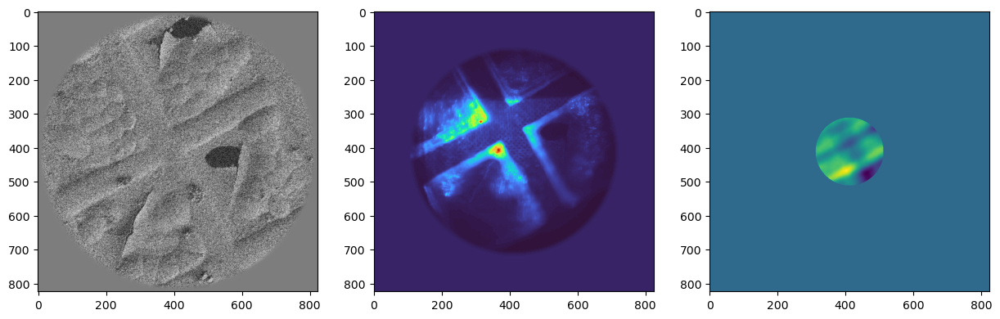

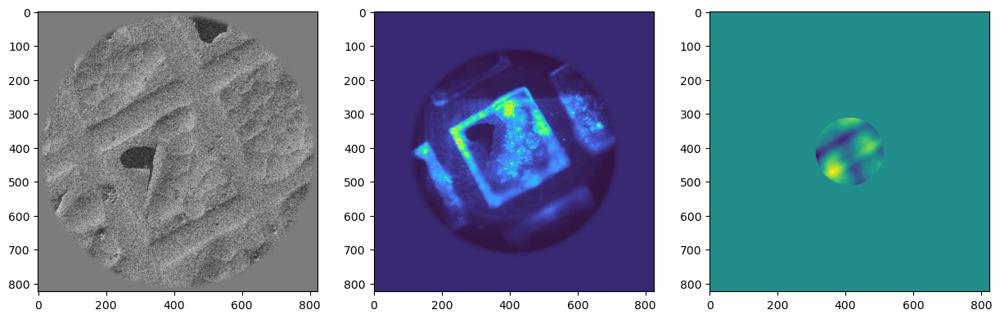

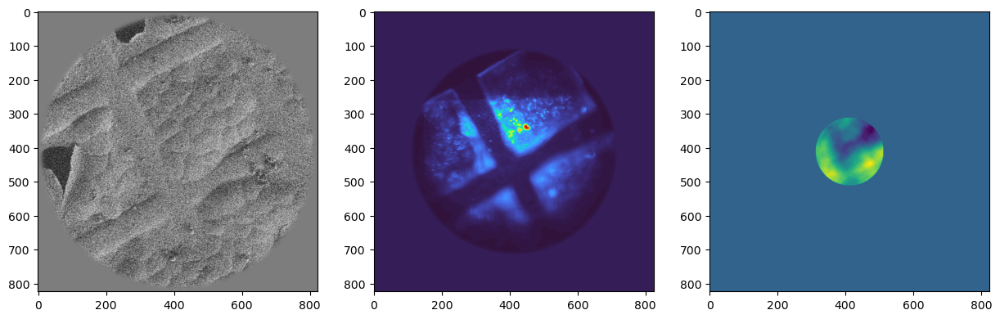

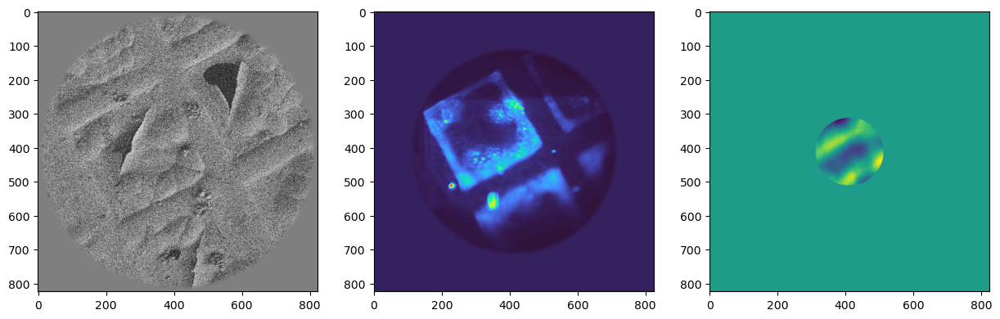

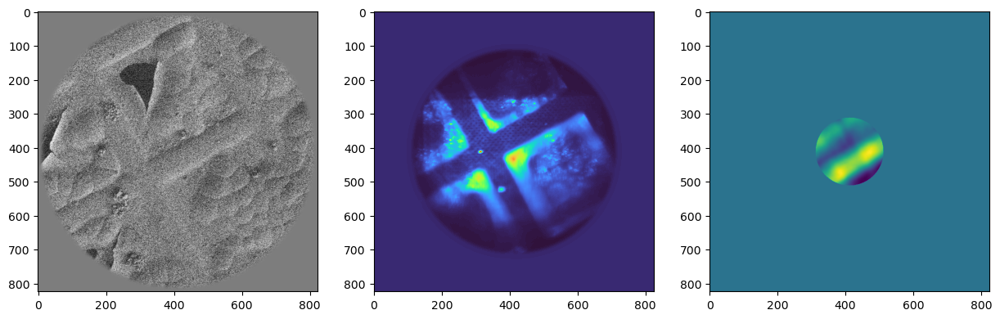

...

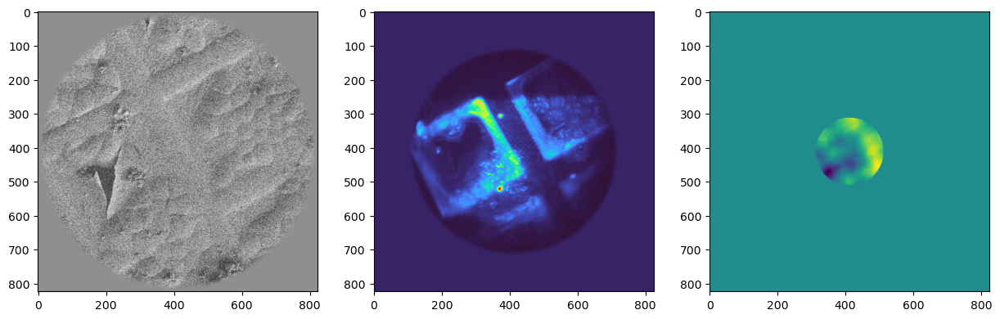

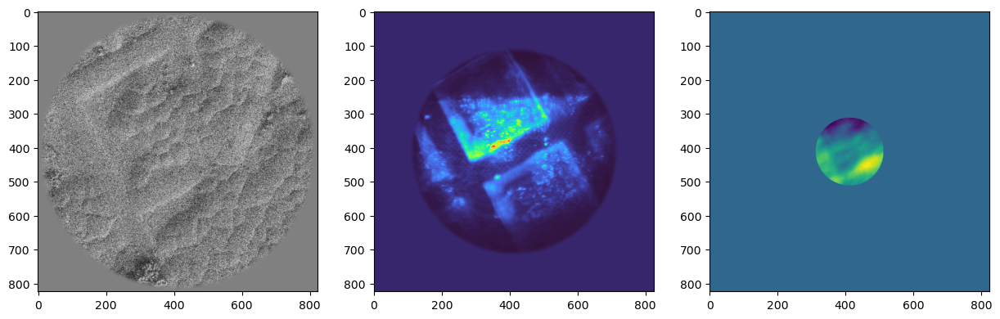

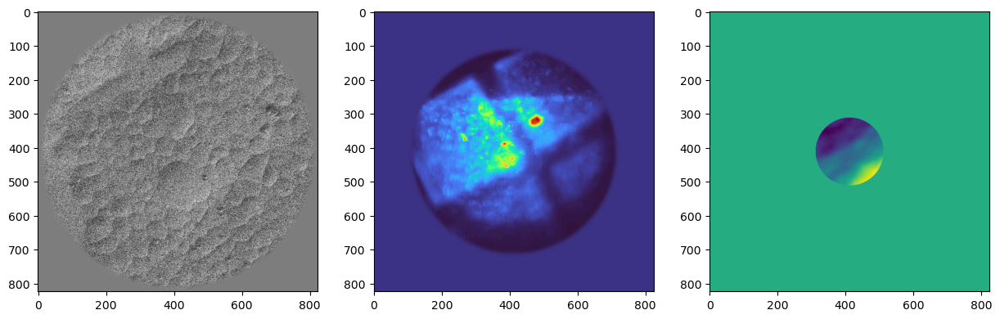

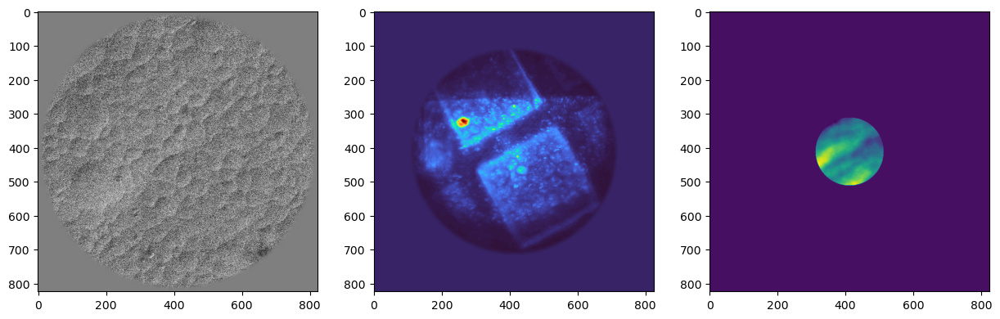

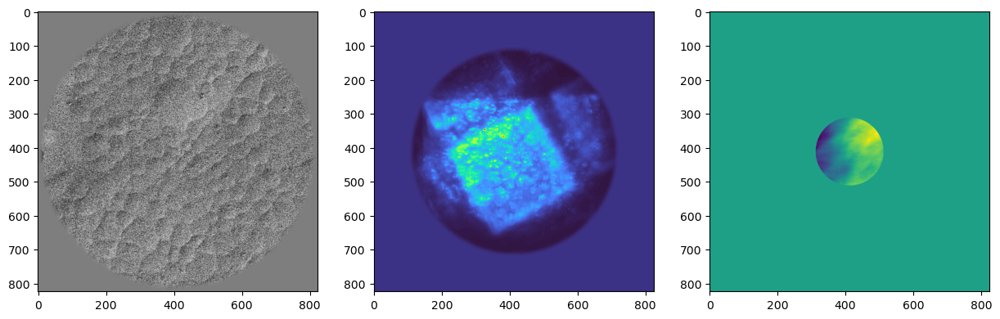

In [476]:
for i in range(12):
    fig, ax = plt.subplots(1,3,figsize=(15,15))
    ax[0].imshow(ib_normalized[i], cmap='gray')
    ax[1].imshow(fl_normalized[i], cmap='turbo')
    ax[2].imshow(normalized_corr[i])

[-57  11]


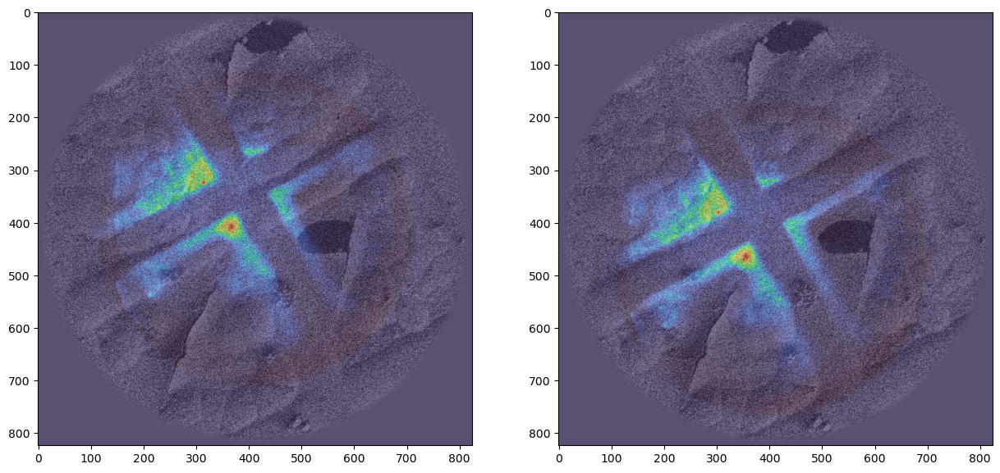

[-61  50]


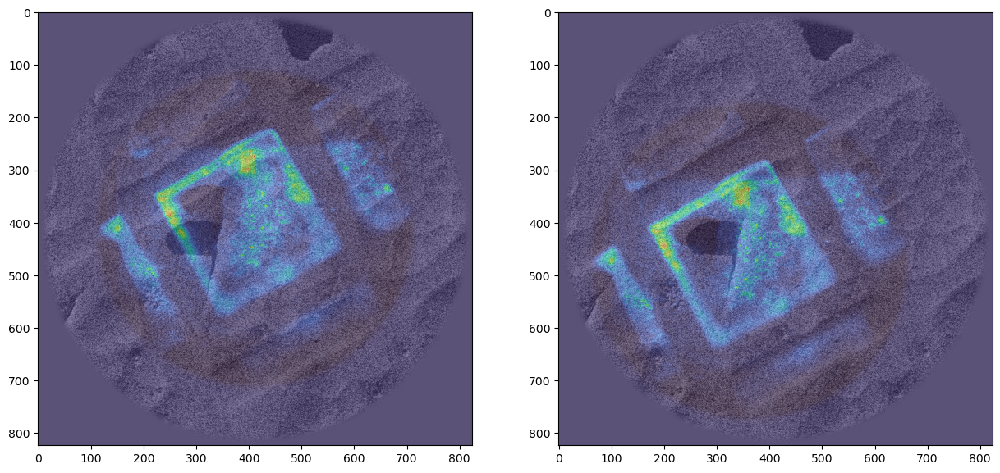

[-36 -59]


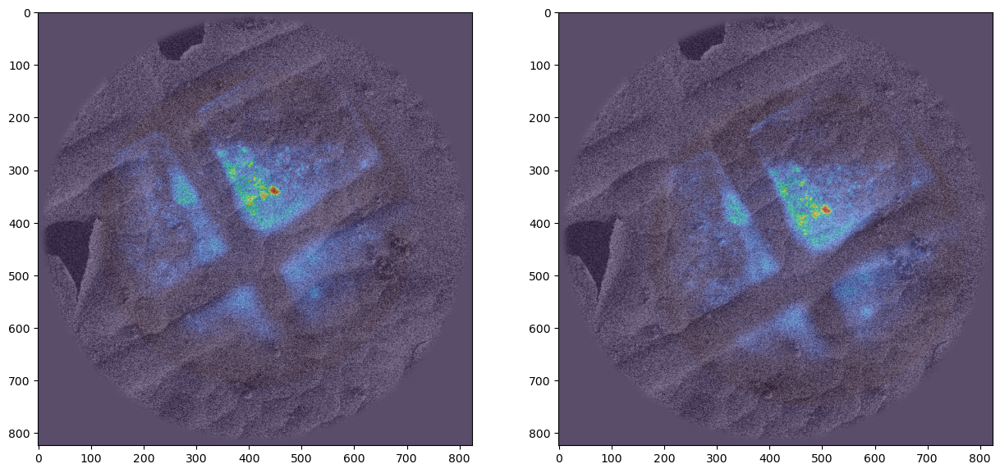

[-25 -95]


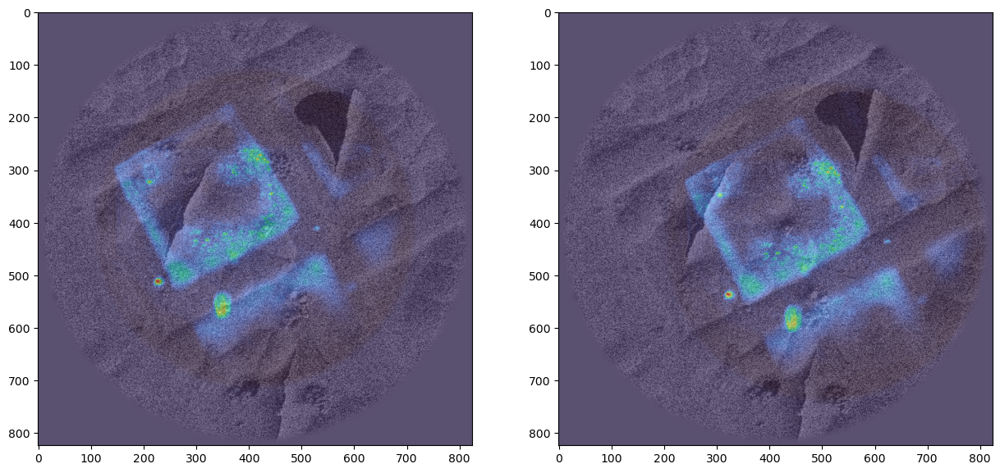

[ -4 -60]


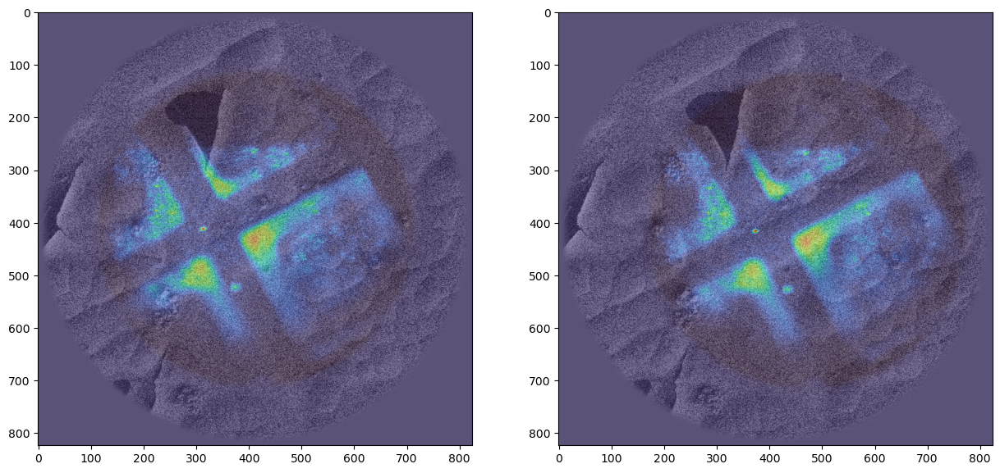

[82 57]


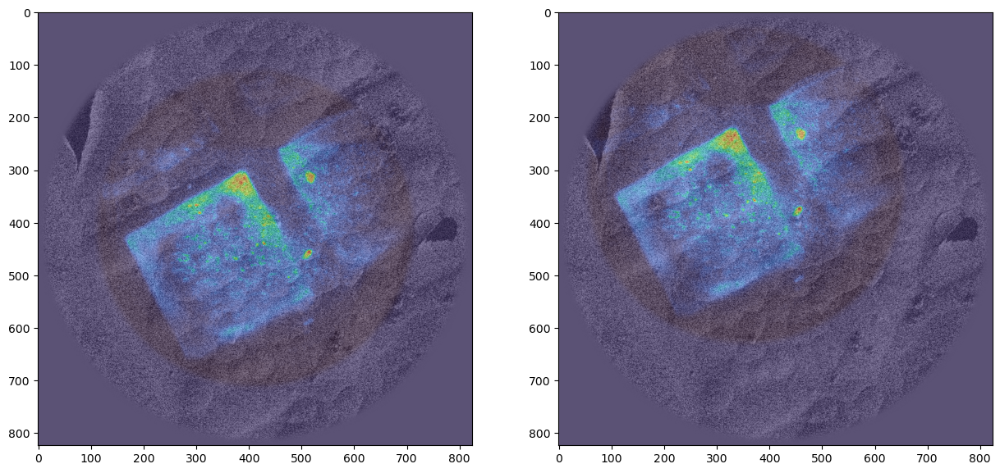

[ 5 99]


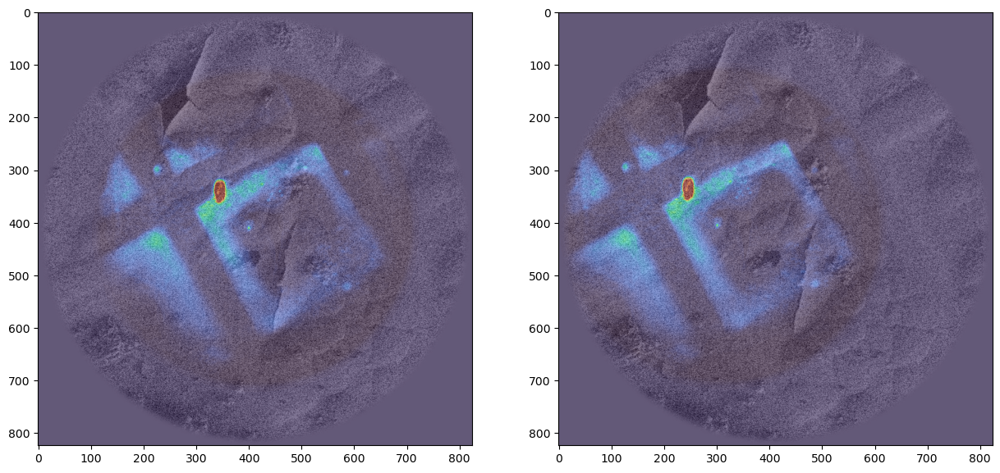

[-40 -83]


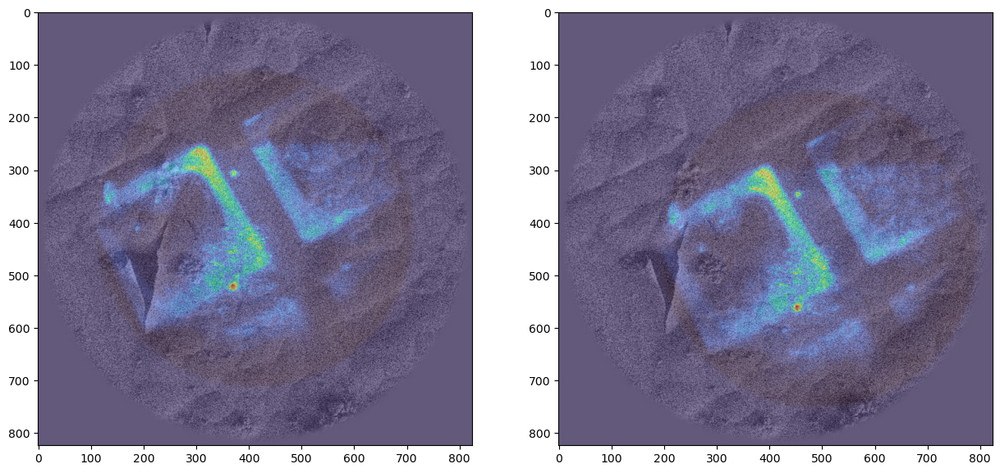

[-42 -52]


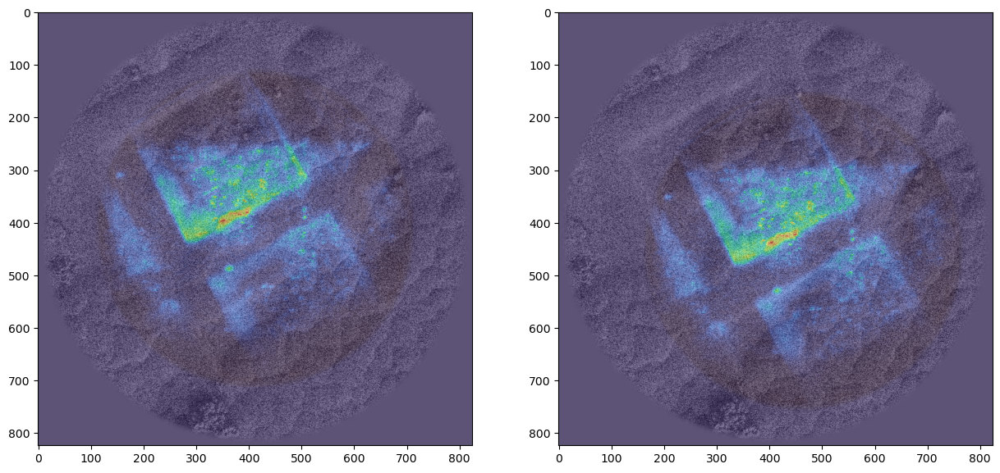

[-62 -78]


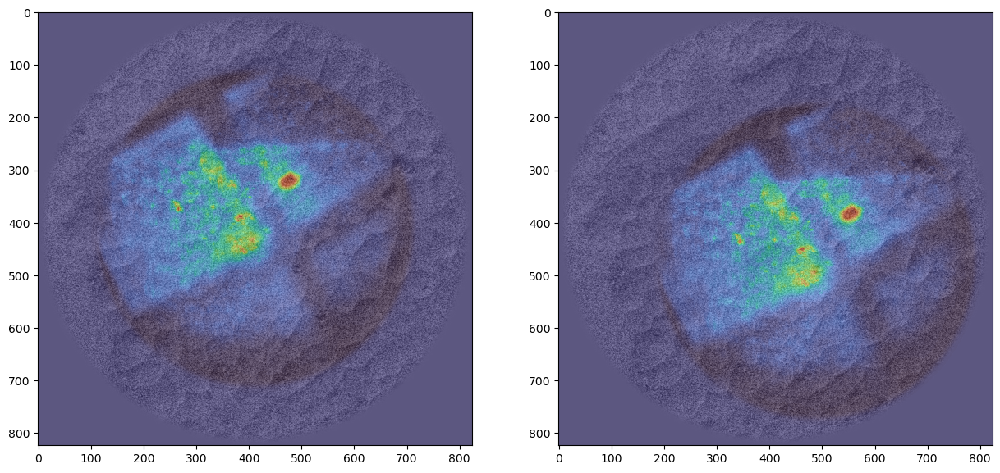

[-39  92]


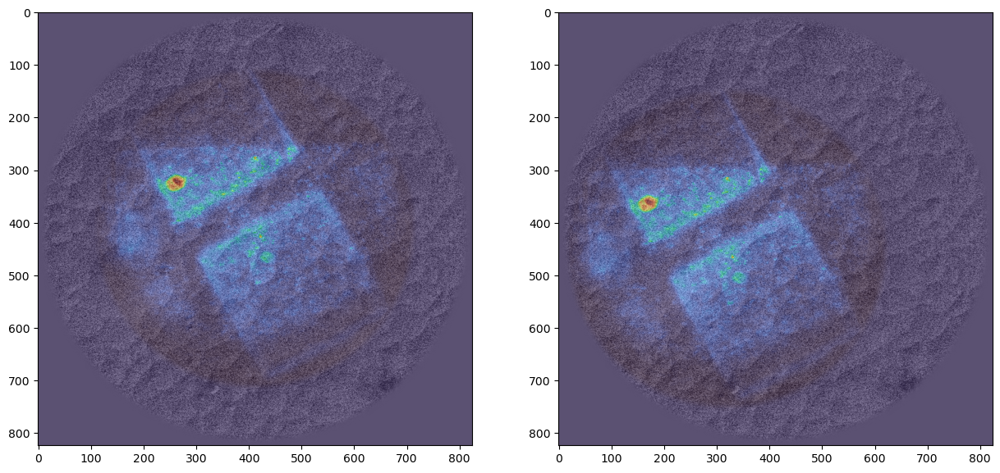

[ 54 -84]


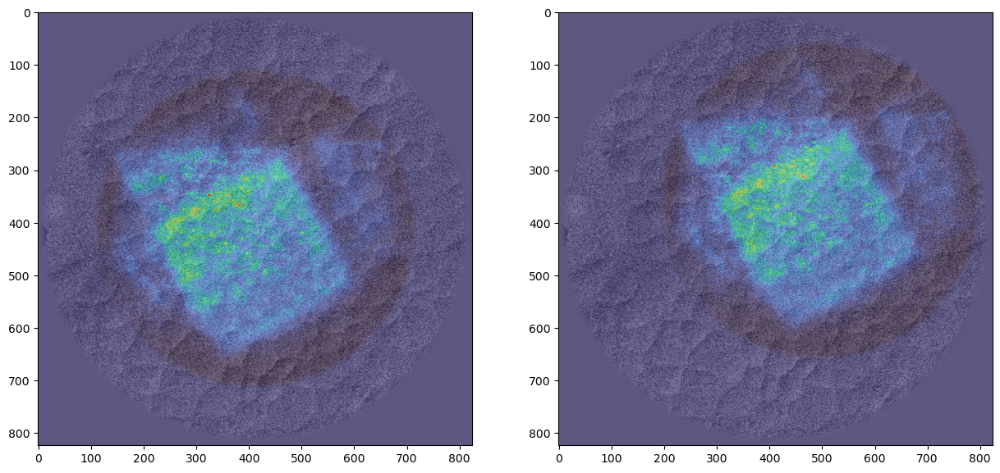

In [477]:
for i in range(12):
    fig, ax = plt.subplots(1,2,figsize=(15,15))
    print(normalized_err[i])
    ax[0].imshow(ib_normalized[i], alpha=1, cmap='gray')
    ax[0].imshow(fl_normalized[i], alpha=0.5, cmap='turbo')
    ax[1].imshow(ib_normalized[i], alpha=1, cmap='gray')
    ax[1].imshow(np.roll(fl_normalized[i], shift=(-normalized_err[i]), axis=(0,1)), alpha=0.5, cmap='turbo')
    plt.show()